Copyright © The University of Edinburgh, 2024.

Development has been supported by GSK.

# Write CSV file containing Compactness, Distinctness, and Uniqueness for all treatments.
Note: this is for illustrative purposes only, so we choose the Cosine metric and take values from this only 

In [6]:
# Plot Distinctness vs AUROC, coloured by Distinctness for the cosine metric
import pandas as pd
import numpy as np
from pathlib import Path
from tqdm import tqdm
from scipy.stats import percentileofscore
from ast import literal_eval as make_tuple


SEED = 7
MODEL_NAME = "TripletLoss"
MODEL_IDENTIFIER = "155"
working_dir = Path("working_dir")
eval_data_dir = (
    working_dir / Path("plot_data") / Path(MODEL_NAME) / Path(MODEL_IDENTIFIER)
)
output_dir = (
    eval_data_dir / Path("compactness_vs_distinctness_vs_uniqueness")
)
if not eval_data_dir.exists():
    eval_data_dir.mkdir(parents=True, exist_ok=True)
compactness_dir = eval_data_dir / Path("compactness")
distinctness_dir = eval_data_dir / Path("distinctness")
uniqueness_dir = eval_data_dir / Path("uniqueness")
for metric_name, higher_is_better in [
    ("TripletLoss", False),
    ("Cosine", False),
    ("Zhang", True),
    ("Rank", True),
    ("EuclideanPCA", False),
    ("Euclidean", False),
]:
    print(f"Working on {metric_name}")
    # Get compactness
    df_compactness = pd.concat(
        [
            pd.read_csv(f, index_col=[0])
            for f in tqdm(
                list(
                    compactness_dir.glob(f"pr_{metric_name}_cls?_ps?_seed_{SEED}.csv")
                ),
                desc="Compactness", leave=False,
            )
        ]
    )
    if higher_is_better:
        df_compactness["Compactness percentile"] = df_compactness.apply(
            lambda x: percentileofscore(
                x.values[95:], x["median_replicate_score"], kind="strict"
            ),
            axis=1,
        )
    else:
        df_compactness["Compactness percentile"] = 100 - df_compactness.apply(
            lambda x: percentileofscore(
                x.values[5:], x["median_replicate_score"], kind="strict"
            ),
            axis=1,
        )
    df_compactness = df_compactness[["Compactness percentile"]]
    print(df_compactness)
    df_compactness.index = df_compactness.index.map(
        lambda x: str((make_tuple(x)[2], make_tuple(x)[0], make_tuple(x)[1]))
    )
    df_compactness["Cell line"] = df_compactness.index.map(lambda x: make_tuple(x)[0])
    df_compactness["Treatment"] = df_compactness.index.map(lambda x: make_tuple(x)[1])
    df_compactness["Concentration"] = df_compactness.index.map(lambda x: make_tuple(x)[2])
    df_compactness = df_compactness.sort_index()
    
    # Get distinctness
    df_distinctness = pd.concat(
        [
            pd.read_csv(f, index_col=[0])
            for f in tqdm(
                list(
                    distinctness_dir.glob(f"pt_{metric_name}_cls?_ps?_seed_{SEED}.csv")
                ),
                desc="Distinctness", leave=False,
            )
        ]
    )
    df_distinctness[
        "Distinctness minus_log10_distinctness_pvalue"
    ] = df_distinctness.apply(lambda x: -np.log10(x.values[0]), axis=1)
    df_distinctness = df_distinctness[["Distinctness minus_log10_distinctness_pvalue"]]
    df_distinctness = df_distinctness.sort_index()
    # Get uniqueness
    df_uniqueness = pd.concat(
        [
            pd.read_csv(f, index_col=[0])
            for f in tqdm(
                list(
                    uniqueness_dir.glob(f"auroc_{metric_name}_cls?_ps?_seed_{SEED}.csv")
                ),
                desc="Uniqueness", leave = False,
            )
        ]
    ).rename(columns={"trt_meanauroc": "Uniqueness AUROC"})
    df_uniqueness = df_uniqueness.sort_index()
    df_uniqueness = df_uniqueness[["Uniqueness AUROC"]]

    metric_performance_df = df_compactness.merge(df_distinctness, left_index=True, right_index=True).merge(
        df_uniqueness, left_index=True, right_index=True
    )
    metric_performance_df = metric_performance_df[
        [
            "Cell line",
            "Treatment",
            "Concentration",
            "Compactness percentile",
            "Distinctness minus_log10_distinctness_pvalue",
            "Uniqueness AUROC",
        ]
    ]

    metric_performance_df.to_csv(
        output_dir / f"compactness_vs_distinctness_vs_uniqueness_{metric_name}.csv"
    )
    display(metric_performance_df[["Compactness percentile","Distinctness minus_log10_distinctness_pvalue","Uniqueness AUROC"]].corr(method="pearson").style.set_caption(f"{metric_name}, pearson correlation coefficients"))
    display(metric_performance_df[["Compactness percentile","Distinctness minus_log10_distinctness_pvalue","Uniqueness AUROC"]].corr(method="spearman").style.set_caption(f"{metric_name}, spearman correlation coefficients"))
    metric_performance_df[["Compactness percentile","Distinctness minus_log10_distinctness_pvalue","Uniqueness AUROC"]].corr(method="pearson").to_csv(output_dir / f"correlations_person_compactness_vs_distinctness_vs_uniqueness_{metric_name}.csv")
    metric_performance_df[["Compactness percentile","Distinctness minus_log10_distinctness_pvalue","Uniqueness AUROC"]].corr(method="spearman").to_csv(output_dir / f"correlations_spearman_compactness_vs_distinctness_vs_uniqueness_{metric_name}.csv")


Working on TripletLoss


                                                   Compactness percentile
('16,16-dimethylprostaglandin-e2', 0.04, 'HA1E')                88.188188
('16,16-dimethylprostaglandin-e2', 0.04, 'HT29')                98.998999
('17-hydroxyprogesterone-caproate', 0.04, 'HA1E')               98.398398
('17-hydroxyprogesterone-caproate', 0.04, 'HT29')               98.698699
('17-hydroxyprogesterone-caproate', 0.12, 'HA1E')               98.098098
...                                                                   ...
('xaliproden', 0.12, 'A375')                                    99.599600
('xaliproden', 0.37, 'A375')                                   100.000000
('xaliproden', 1.11, 'A375')                                    98.698699
('xaliproden', 3.33, 'A375')                                    92.692693
('xaliproden', 10.0, 'A375')                                    93.593594

[57496 rows x 1 columns]


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,0.212091,0.618327
Distinctness minus_log10_distinctness_pvalue,0.212091,1.000000,0.165782
Uniqueness AUROC,0.618327,0.165782,1.000000


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,0.247750,0.713390
Distinctness minus_log10_distinctness_pvalue,0.247750,1.000000,0.123847
Uniqueness AUROC,0.713390,0.123847,1.000000


Working on Cosine


                                         Compactness percentile
('5-aminolevulinic-acid', 0.04, 'HA1E')               88.088088
('5-aminolevulinic-acid', 0.04, 'HT29')              100.000000
('5-aminolevulinic-acid', 0.12, 'HA1E')               98.398398
('5-aminolevulinic-acid', 0.12, 'HT29')               19.519520
('5-aminolevulinic-acid', 0.37, 'HA1E')               75.975976
...                                                         ...
('warfarin', 0.12, 'A375')                            81.781782
('warfarin', 0.37, 'A375')                            16.316316
('warfarin', 1.11, 'A375')                            21.021021
('warfarin', 3.33, 'A375')                            74.574575
('warfarin', 10.0, 'A375')                            86.986987

[57496 rows x 1 columns]


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,0.115768,0.872262
Distinctness minus_log10_distinctness_pvalue,0.115768,1.000000,0.115433
Uniqueness AUROC,0.872262,0.115433,1.000000


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,0.148260,0.885405
Distinctness minus_log10_distinctness_pvalue,0.148260,1.000000,0.099726
Uniqueness AUROC,0.885405,0.099726,1.000000


Working on Zhang


                              Compactness percentile
('ABT-724', 0.04, 'HA1E')                  78.767877
('ABT-724', 0.04, 'HT29')                  71.177118
('ABT-724', 0.12, 'HA1E')                  74.037404
('ABT-724', 0.12, 'HT29')                  83.388339
('ABT-724', 0.37, 'HA1E')                  83.718372
...                                              ...
('zidovudine', 0.12, 'MCF7')               97.029703
('zidovudine', 0.37, 'MCF7')               43.564356
('zidovudine', 1.11, 'MCF7')               68.866887
('zidovudine', 3.33, 'MCF7')               97.469747
('zidovudine', 10.0, 'MCF7')               96.919692

[57496 rows x 1 columns]


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,0.160111,0.885730
Distinctness minus_log10_distinctness_pvalue,0.160111,1.000000,0.187046
Uniqueness AUROC,0.885730,0.187046,1.000000


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,0.190344,0.907225
Distinctness minus_log10_distinctness_pvalue,0.190344,1.000000,0.168987
Uniqueness AUROC,0.907225,0.168987,1.000000


Working on Rank


                              Compactness percentile
('ABT-724', 0.04, 'YAPC')                  19.251925
('ABT-724', 0.12, 'YAPC')                  21.562156
('ABT-724', 0.37, 'YAPC')                  55.115512
('ABT-724', 1.11, 'YAPC')                  84.158416
('ABT-724', 3.33, 'YAPC')                  36.523652
...                                              ...
('xaliproden', 0.12, 'A375')               92.959296
('xaliproden', 0.37, 'A375')               93.289329
('xaliproden', 1.11, 'A375')               98.789879
('xaliproden', 3.33, 'A375')               70.957096
('xaliproden', 10.0, 'A375')               91.199120

[57496 rows x 1 columns]


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,0.160467,0.508905
Distinctness minus_log10_distinctness_pvalue,0.160467,1.000000,0.134558
Uniqueness AUROC,0.508905,0.134558,1.000000


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,0.190814,0.600345
Distinctness minus_log10_distinctness_pvalue,0.190814,1.000000,0.085932
Uniqueness AUROC,0.600345,0.085932,1.000000


Working on EuclideanPCA


                                         Compactness percentile
('5-aminolevulinic-acid', 0.04, 'A375')               59.559560
('5-aminolevulinic-acid', 0.12, 'A375')               62.762763
('5-aminolevulinic-acid', 0.37, 'A375')               59.659660
('5-aminolevulinic-acid', 1.11, 'A375')               86.286286
('5-aminolevulinic-acid', 3.33, 'A375')               73.273273
...                                                         ...
('zidovudine', 0.12, 'YAPC')                          62.762763
('zidovudine', 0.37, 'YAPC')                          91.991992
('zidovudine', 1.11, 'YAPC')                          38.238238
('zidovudine', 3.33, 'YAPC')                          71.671672
('zidovudine', 10.0, 'YAPC')                          86.586587

[57496 rows x 1 columns]


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,-0.537301,0.708296
Distinctness minus_log10_distinctness_pvalue,-0.537301,1.000000,-0.131702
Uniqueness AUROC,0.708296,-0.131702,1.000000


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,-0.743218,0.736255
Distinctness minus_log10_distinctness_pvalue,-0.743218,1.000000,-0.504920
Uniqueness AUROC,0.736255,-0.504920,1.000000


Working on Euclidean


                                         Compactness percentile
('5-aminolevulinic-acid', 0.04, 'HA1E')               76.776777
('5-aminolevulinic-acid', 0.04, 'HT29')               65.665666
('5-aminolevulinic-acid', 0.12, 'HA1E')               45.045045
('5-aminolevulinic-acid', 0.12, 'HT29')               27.527528
('5-aminolevulinic-acid', 0.37, 'HA1E')               73.473473
...                                                         ...
('warfarin', 0.12, 'A375')                            16.516517
('warfarin', 0.37, 'A375')                            23.623624
('warfarin', 1.11, 'A375')                            31.131131
('warfarin', 3.33, 'A375')                            60.160160
('warfarin', 10.0, 'A375')                            34.634635

[57496 rows x 1 columns]


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,-0.570627,0.744276
Distinctness minus_log10_distinctness_pvalue,-0.570627,1.000000,-0.261366
Uniqueness AUROC,0.744276,-0.261366,1.000000


,Compactness percentile,Distinctness minus_log10_distinctness_pvalue,Uniqueness AUROC
Compactness percentile,1.000000,-0.739023,0.767585
Distinctness minus_log10_distinctness_pvalue,-0.739023,1.000000,-0.557634
Uniqueness AUROC,0.767585,-0.557634,1.000000


## Produce a plot of Compactness vs Uniqueness, coloured by Distinctness

Working on Compactness vs Distinctness plot for the TripletLoss metric


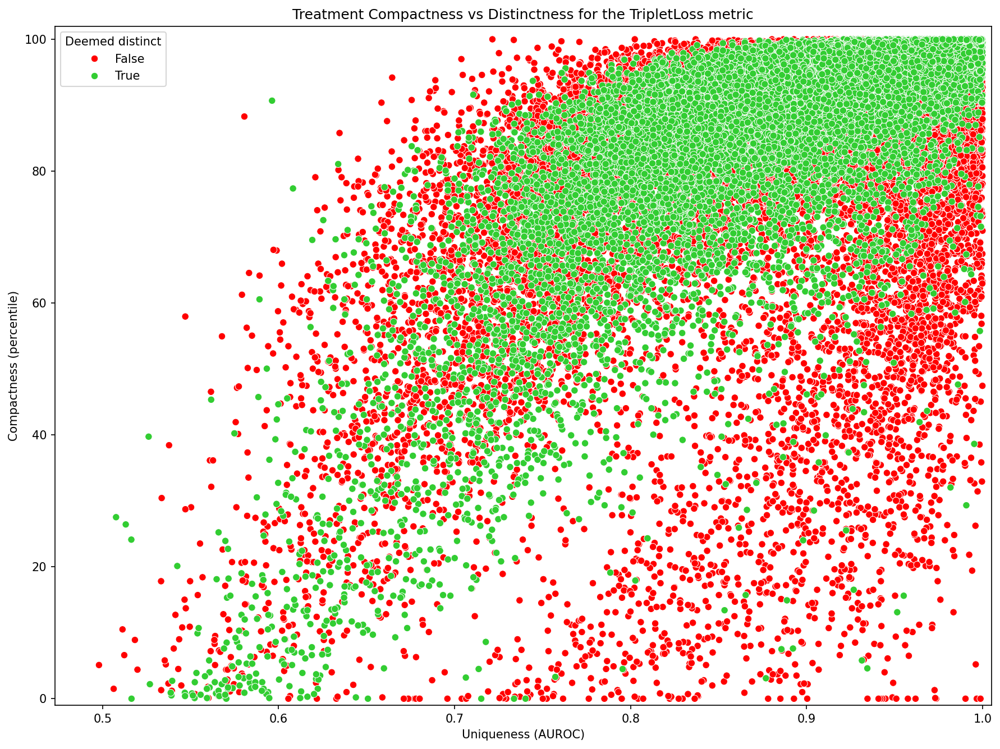

Working on Compactness vs Distinctness plot for the Cosine metric


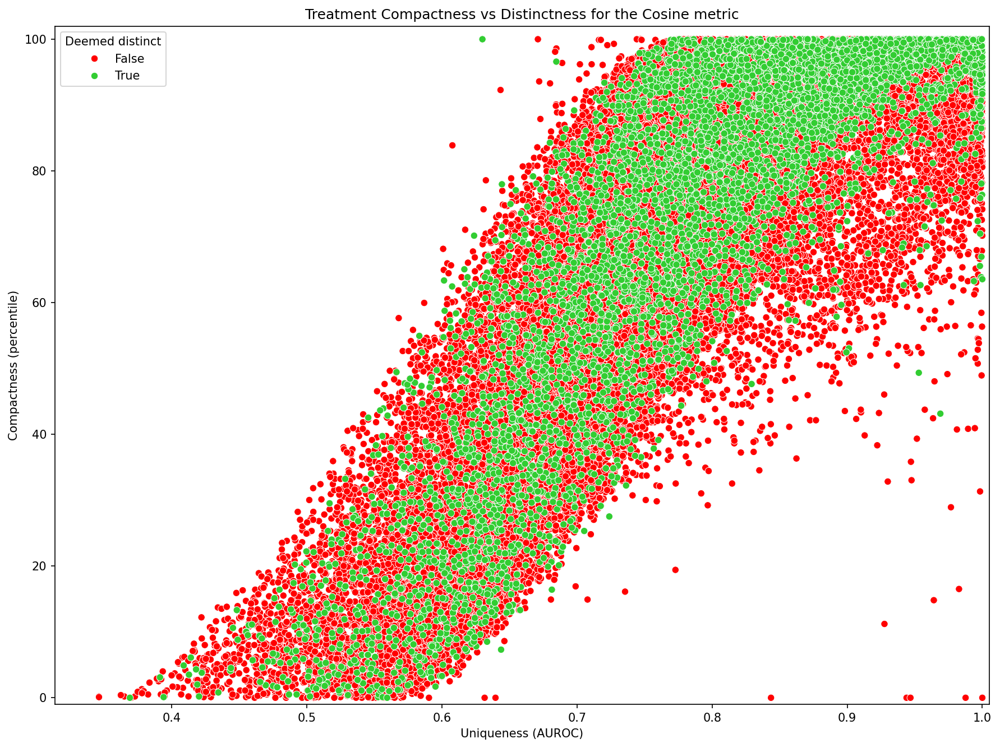

Working on Compactness vs Distinctness plot for the Zhang metric


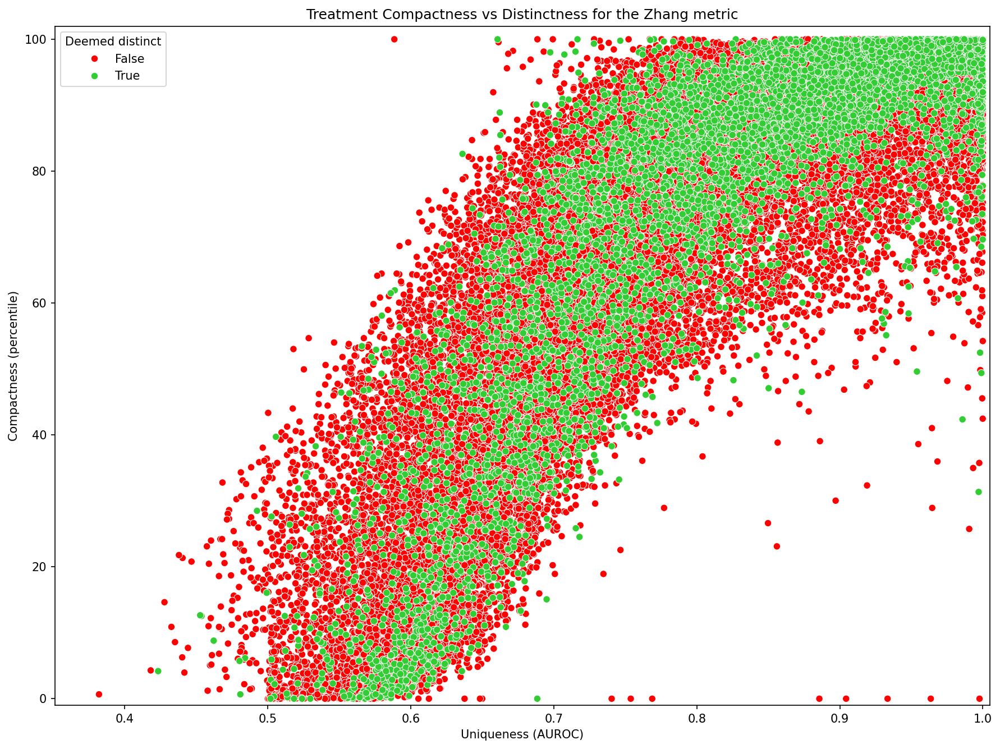

Working on Compactness vs Distinctness plot for the Rank metric


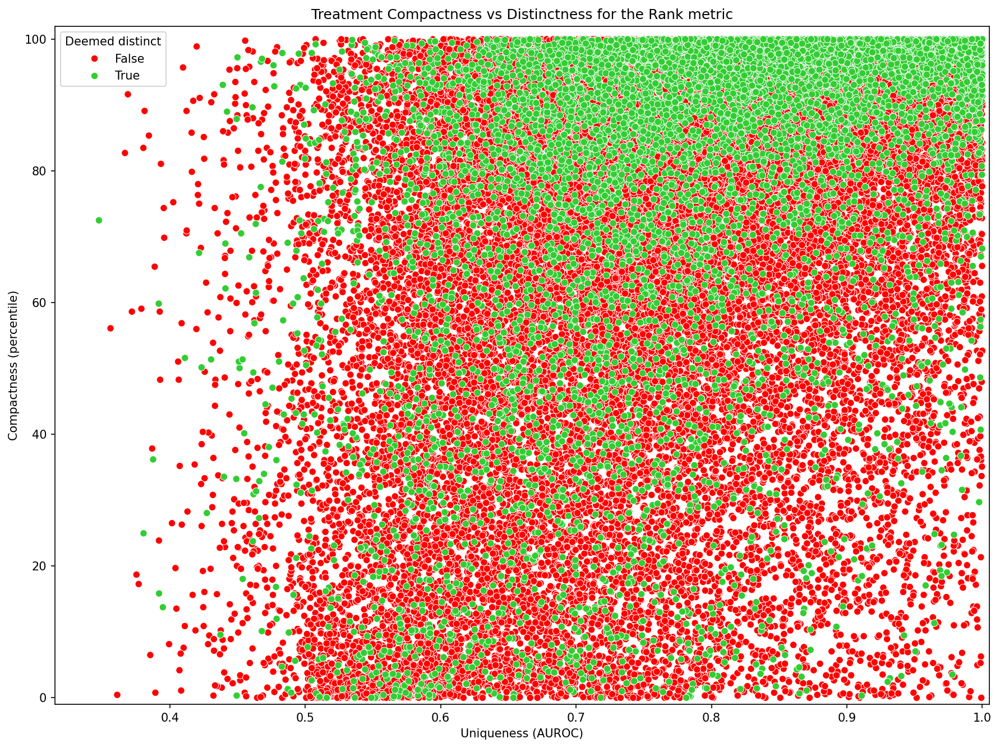

Working on Compactness vs Distinctness plot for the EuclideanPCA metric


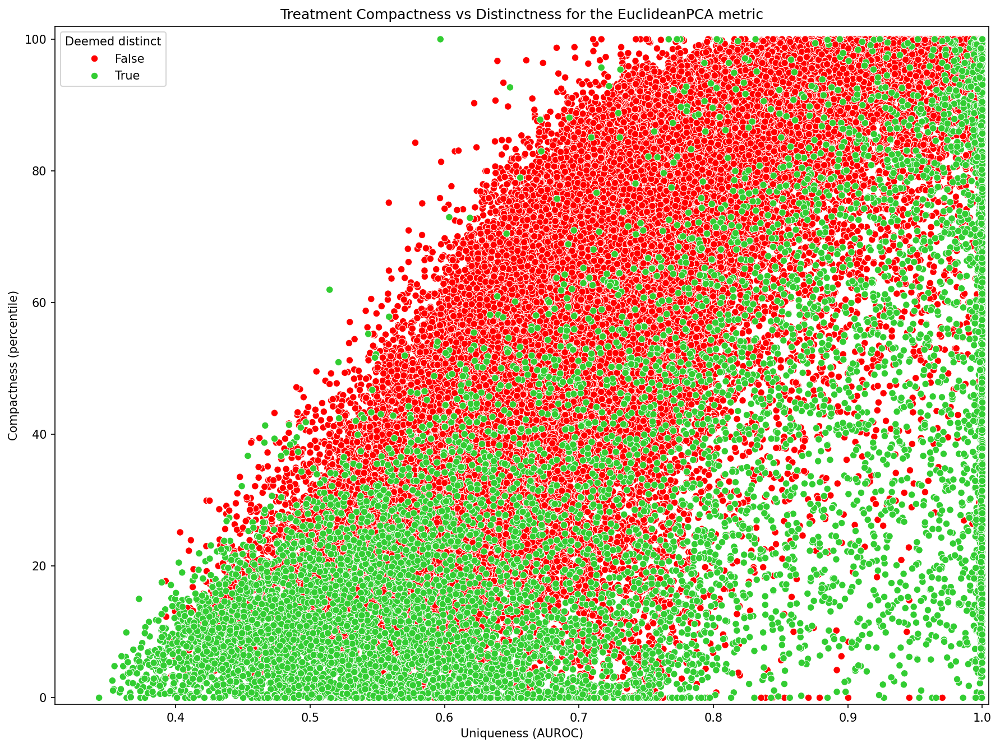

Working on Compactness vs Distinctness plot for the Euclidean metric


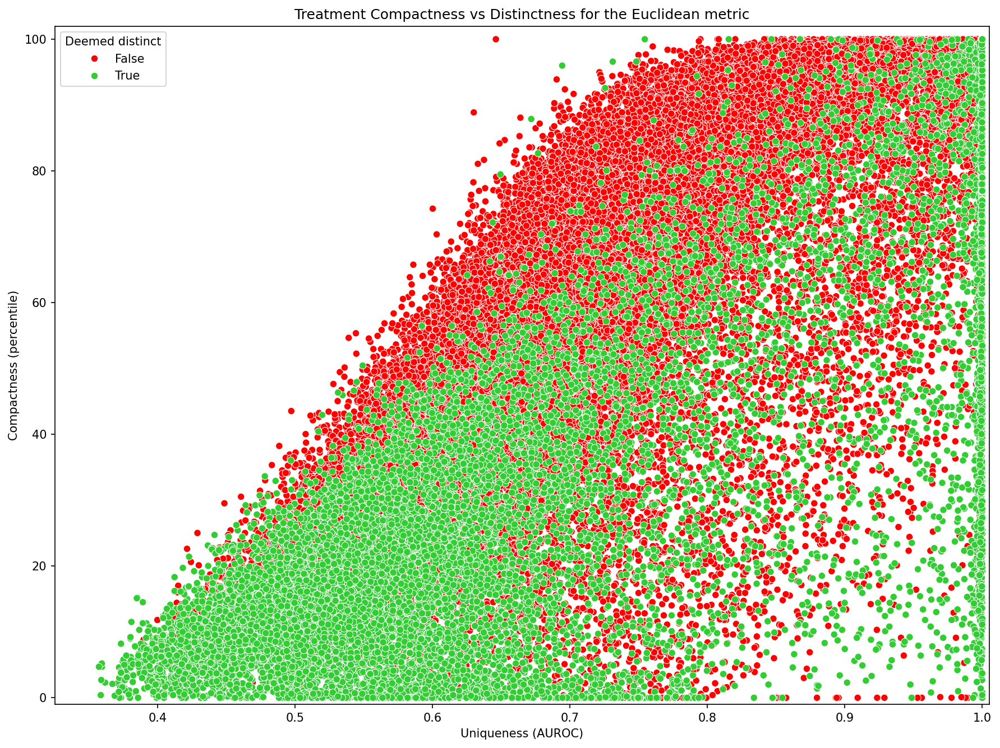

In [7]:
# Plot Distinctness vs AUROC, coloured by Distinctness for the cosine metric
import seaborn as sns
from pathlib import Path
import pandas as pd
import numpy as np
from tqdm import tqdm
from matplotlib import pyplot as plt

MODEL_NAME = "TripletLoss"
MODEL_IDENTIFIER = "155"

working_dir = Path("working_dir")
eval_data_dir = (
    working_dir / Path("plot_data") / Path(MODEL_NAME) / Path(MODEL_IDENTIFIER)
)
data_dir = eval_data_dir / Path("compactness_vs_distinctness_vs_uniqueness")

for metric_name in [
    "TripletLoss",
    "Cosine",
    "Zhang",
    "Rank",
    "EuclideanPCA",
    "Euclidean",
]:
    print(f"Working on Compactness vs Distinctness plot for the {metric_name} metric")
    metric_performance_df = pd.read_csv(
        data_dir / f"compactness_vs_distinctness_vs_uniqueness_{metric_name}.csv",
        index_col=0,
    )
    metric_performance_df["Deemed distinct"] = metric_performance_df[
        "Distinctness minus_log10_distinctness_pvalue"
    ] > -np.log10(0.05)
    fig, ax = plt.subplots(1, figsize=(12, 9), dpi=150)
    sns.scatterplot(
        metric_performance_df.sort_values(
            "Deemed distinct", key=np.vectorize([False, True].index)
        ),
        x="Uniqueness AUROC",
        y="Compactness percentile",
        hue="Deemed distinct",
        ax=ax,
        palette=["red", "limegreen"],
        hue_order=[False, True],
    )
    ax.set_xlabel("Uniqueness (AUROC)")
    ax.set_ylabel("Compactness (percentile)")
    ax.set_xlim((None, 1.005))
    ax.set_ylim((-1, 102))
    ax.set_title(f"Treatment Compactness vs Distinctness for the {metric_name} metric")
    plt.tight_layout()
    #ax.set_facecolor("white")
    plt.savefig(data_dir / f"plot_compactness_vs_uniqueness_{metric_name}.svg")
    plt.savefig(data_dir / f"plot_compactness_vs_uniqueness_{metric_name}.png", dpi=300)
    plt.show()

# Investigate interesting MOAs from EuclideanPCA metric scatter plots

In [8]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns

metric_name = 'EuclideanPCA'

MODEL_NAME = "TripletLoss"
MODEL_IDENTIFIER = "155"
working_dir = Path("working_dir")
eval_data_dir = working_dir / Path("plot_data") / Path(MODEL_NAME) / Path(MODEL_IDENTIFIER)
data_dir = eval_data_dir / Path("compactness_vs_distinctness_vs_uniqueness")


metric_performance_df = pd.read_csv(
        data_dir / f"compactness_vs_distinctness_vs_uniqueness_{metric_name}.csv",
        index_col=0,
    )


# Top left - low uniquness, high compactness
row_lu_hc=metric_performance_df.query("`Uniqueness AUROC` <0.55").sort_values("Compactness percentile", ascending=False).iloc[0]
display("Top left", row_lu_hc)
row_hu_hc=metric_performance_df.query("`Uniqueness AUROC`>0.99").sort_values("Compactness percentile", ascending=False).iloc[0]
display("Top right", row_hu_hc)
row_hu_lc=metric_performance_df.query("`Uniqueness AUROC`>0.99").sort_values("Compactness percentile", ascending=True).iloc[0]
display("Bottom right", row_hu_lc)
row_lu_lc=metric_performance_df.query("`Uniqueness AUROC`<0.35").sort_values("Compactness percentile", ascending=True).iloc[0]
display("Bottom left", row_lu_lc)


# This function will be used later to apply transformers
def apply_transformer(
    transformer_class, transformer_init_args, df, features_in, features_out
):
    print(f"Applying the transformer instantiated by {transformer_class}")
    transformer = transformer_class(**transformer_init_args)
    transformed_data = transformer.fit_transform(df[features_in])
    if isinstance(features_out, str):
        if features_out == "PC":
            features_out = [
                f"PC_1 ({transformer.explained_variance_ratio_[0]:.3f} f.e.v)",
                f"PC_2 ({transformer.explained_variance_ratio_[1]:.3f} f.e.v)",
            ]
        else:
            features_out = [
                f"{features_out}_{i}" for i in range(1, transformed_data.shape[1] + 1)
            ]
    return (
        pd.concat(
            [
                df,
                pd.DataFrame(
                    data=transformed_data,
                    columns=features_out,
                    index=df.index,
                ),
            ],
            axis=1,
        ),
        features_out,
    )

'Top left'

Cell line                                        NPC.CAS9
Treatment                                       SB-216763
Concentration                                        3.33
Compactness percentile                          61.961962
Distinctness minus_log10_distinctness_pvalue     1.610834
Uniqueness AUROC                                 0.514561
Name: ('NPC.CAS9', 'SB-216763', 3.33), dtype: object

'Top right'

Cell line                                           A375
Treatment                                        ABT-737
Concentration                                       10.0
Compactness percentile                             100.0
Distinctness minus_log10_distinctness_pvalue     0.03654
Uniqueness AUROC                                0.999584
Name: ('A375', 'ABT-737', 10.0), dtype: object

'Bottom right'

Cell line                                            LNCAP
Treatment                                       BMS-345541
Concentration                                         10.0
Compactness percentile                                 0.0
Distinctness minus_log10_distinctness_pvalue           4.0
Uniqueness AUROC                                       1.0
Name: ('LNCAP', 'BMS-345541', 10.0), dtype: object

'Bottom left'

Cell line                                               PC3
Treatment                                       piclamilast
Concentration                                          10.0
Compactness percentile                                  0.0
Distinctness minus_log10_distinctness_pvalue            4.0
Uniqueness AUROC                                   0.343001
Name: ('PC3', 'piclamilast', 10.0), dtype: object

Next, use grep in the form of :
```bash
grep 'SB-216763' working_dir/plot_data/TripletLoss/511/permutationtest/*EuclideanPCA*.csv | grep 'NPC.CAS9' | head -n1 | xargs basename | cut -f3,4 -d_
grep 'ABT-737' working_dir/plot_data/TripletLoss/511/permutationtest/*EuclideanPCA*.csv | grep 'A375' | head -n1 | xargs basename | cut -f3,4 -d_
grep 'BMS-345541' working_dir/plot_data/TripletLoss/511/permutationtest/*EuclideanPCA*.csv | grep 'LNCAP' | head -n1 | xargs basename | cut -f3,4 -d_
grep 'piclamilast' working_dir/plot_data/TripletLoss/511/permutationtest/*EuclideanPCA*.csv | grep 'PC3' | head -n1 | xargs basename | cut -f3,4 -d_

```
To find out which split each interesting point came from and record as below

In [9]:
row_lu_hc['cell line split'] = 2
row_lu_hc['moa split'] = 3
row_lu_hc['location'] = "top left"


row_hu_hc['cell line split'] = 2
row_hu_hc['moa split'] = 4
row_hu_hc['location'] = "top right"

row_hu_lc['cell line split'] = 3
row_hu_lc['moa split'] = 4
row_hu_lc['location'] = "bottom right"

row_lu_lc['cell line split'] = 4
row_lu_lc['moa split'] = 4
row_lu_lc['location'] = 'bottom left'

And plot everything:

Loading fitted standard scaler and PCA found in split json dir (working_dir/split_data/stdscaler_and_pca.pkl)
Applying the transformer instantiated by <class 'sklearn.preprocessing._data.StandardScaler'>
['scaled_AARS', 'scaled_ABCB6', 'scaled_ABCC5', 'scaled_ABCF1', 'scaled_ABCF3', 'scaled_ABHD4', 'scaled_ABHD6', 'scaled_ABL1', 'scaled_ACAA1', 'scaled_ACAT2', 'scaled_ACBD3', 'scaled_ACD', 'scaled_ACLY', 'scaled_ACOT9', 'scaled_ADAM10', 'scaled_ADAT1', 'scaled_ADCK3', 'scaled_ADGRE5', 'scaled_ADGRG1', 'scaled_ADH5', 'scaled_ADI1', 'scaled_ADO', 'scaled_ADRB2', 'scaled_AGL', 'scaled_AKAP8', 'scaled_AKAP8L', 'scaled_AKR7A2', 'scaled_AKT1', 'scaled_ALAS1', 'scaled_ALDH7A1', 'scaled_ALDOA', 'scaled_ALDOC', 'scaled_AMDHD2', 'scaled_ANKRD10', 'scaled_ANO10', 'scaled_ANXA7', 'scaled_APBB2', 'scaled_APOE', 'scaled_APP', 'scaled_APPBP2', 'scaled_ARFIP2', 'scaled_ARHGAP1', 'scaled_ARHGEF2', 'scaled_ARHGEF12', 'scaled_ARID4B', 'scaled_ARID5B', 'scaled_ARL4C', 'scaled_ARNT2', 'scaled_ARPP19', 'sca

/home/ss942793/.conda/envs/leakproofcmap/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


          DDR1    PAX8    RPS5   ABCF1    SPAG7    RHOA   RNPS1  SMNDC1  \
172058  0.4751 -1.0299 -0.7533  0.3555   1.8392  0.7000  0.6745 -1.1133   
171870  0.1214  0.4554  0.8304  0.0415   0.8229  1.4996  0.0000 -0.3816   
172246  1.5790 -0.1585  0.5415 -0.6201   0.1897  1.3802 -1.1379  0.0540   
171900 -0.4380 -0.8797 -0.6833 -0.7701  -0.5484  3.4252 -0.6745  0.8227   
172087  0.6587 -0.3043 -0.2670 -1.0425  -0.3666  3.4952  0.6745 -0.3978   
...        ...     ...     ...     ...      ...     ...     ...     ...   
175484 -1.5233 -1.5095  0.0349 -1.5433 -17.5534  0.3887  0.0000  0.4533   
175258  0.4644 -0.8280  1.2292 -1.7249   0.6688  1.4911 -0.6745 -1.6055   
172289  0.2920 -0.7715  2.1814 -0.3137   0.3932  0.5180  0.0000 -0.1187   
175421 -0.7648  0.0305 -0.4543 -1.5433   0.2955  0.7816 -1.4566 -1.2525   
172322  0.7562  0.9688  2.3945  0.0359  -0.9813  0.0587  0.0000  2.5017   

        ATP6V0B    RPS6  ...  scaled_ZNF451  scaled_ZNF586  scaled_ZNF589  \
172058   0.3238  0.674

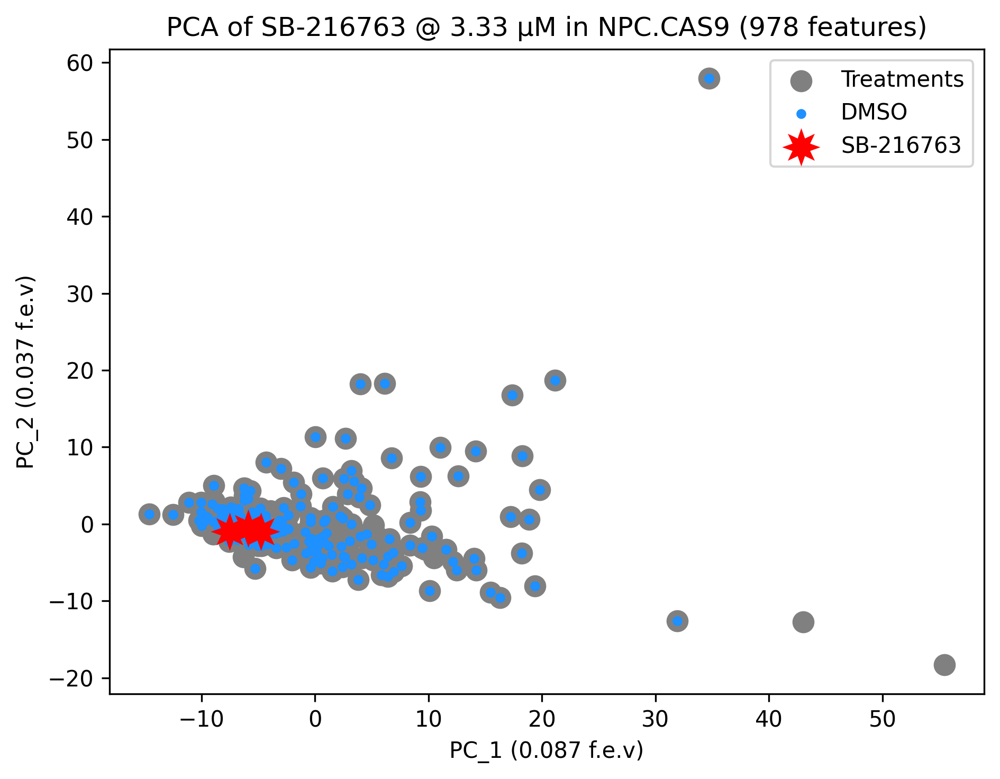

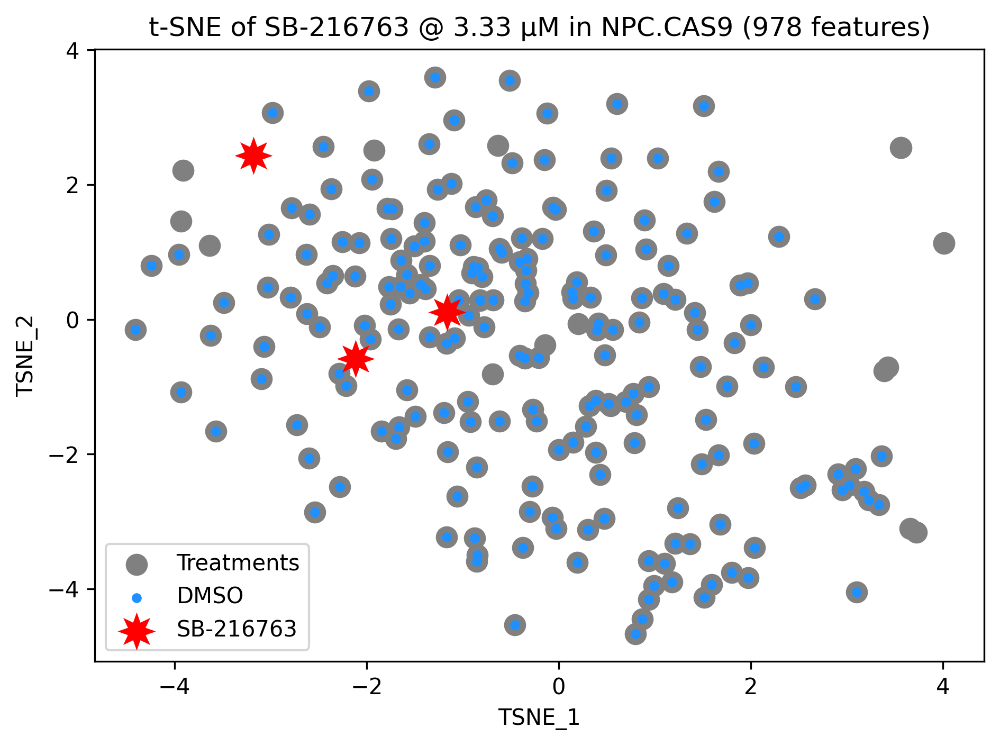

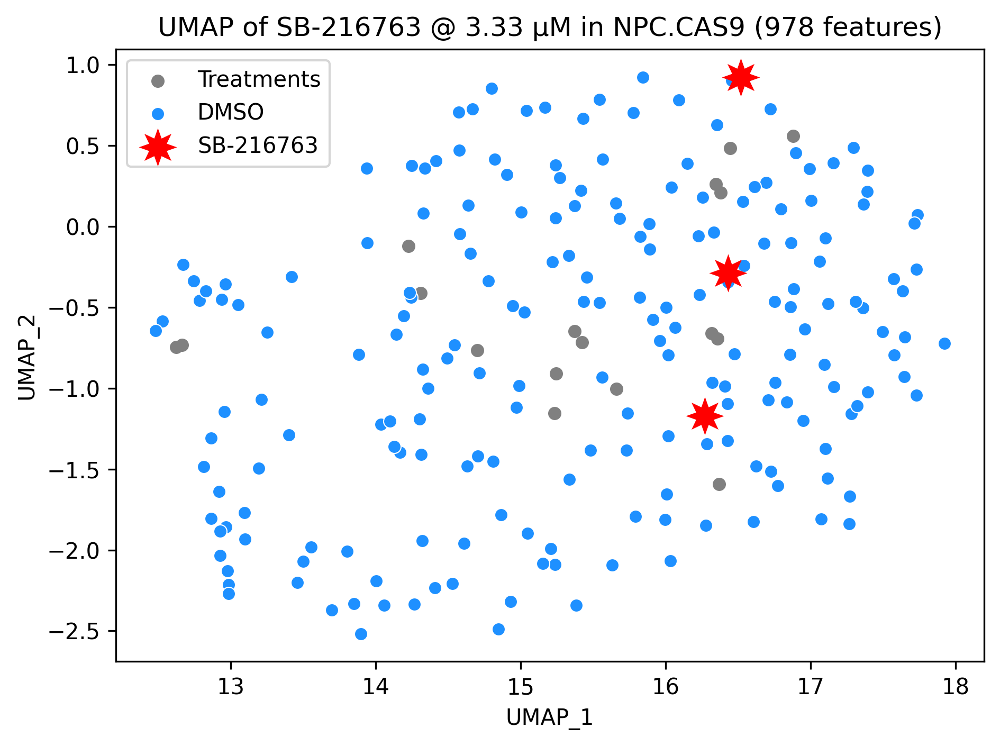

Loading fitted standard scaler and PCA found in split json dir (working_dir/split_data/stdscaler_and_pca.pkl)
Applying the transformer instantiated by <class 'sklearn.preprocessing._data.StandardScaler'>
['scaled_AARS', 'scaled_ABCB6', 'scaled_ABCC5', 'scaled_ABCF1', 'scaled_ABCF3', 'scaled_ABHD4', 'scaled_ABHD6', 'scaled_ABL1', 'scaled_ACAA1', 'scaled_ACAT2', 'scaled_ACBD3', 'scaled_ACD', 'scaled_ACLY', 'scaled_ACOT9', 'scaled_ADAM10', 'scaled_ADAT1', 'scaled_ADCK3', 'scaled_ADGRE5', 'scaled_ADGRG1', 'scaled_ADH5', 'scaled_ADI1', 'scaled_ADO', 'scaled_ADRB2', 'scaled_AGL', 'scaled_AKAP8', 'scaled_AKAP8L', 'scaled_AKR7A2', 'scaled_AKT1', 'scaled_ALAS1', 'scaled_ALDH7A1', 'scaled_ALDOA', 'scaled_ALDOC', 'scaled_AMDHD2', 'scaled_ANKRD10', 'scaled_ANO10', 'scaled_ANXA7', 'scaled_APBB2', 'scaled_APOE', 'scaled_APP', 'scaled_APPBP2', 'scaled_ARFIP2', 'scaled_ARHGAP1', 'scaled_ARHGEF2', 'scaled_ARHGEF12', 'scaled_ARID4B', 'scaled_ARID5B', 'scaled_ARL4C', 'scaled_ARNT2', 'scaled_ARPP19', 'sca

/home/ss942793/.conda/envs/leakproofcmap/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


           DDR1    PAX8    RPS5   ABCF1   SPAG7    RHOA    RNPS1  SMNDC1  \
181947   0.3225 -0.2436 -3.3290 -0.1137  0.6627 -0.7531   0.2208 -0.3780   
182147   3.5111  0.6797 -1.2338  2.7115  1.0404 -0.1896  -0.8111 -0.7210   
50      -0.3789  0.1302  0.6311 -0.0500  0.3730  0.3288   1.4404 -0.1713   
62      -1.5507 -0.1234  0.4579  1.5144 -1.6019 -0.7103 -12.0881 -1.1750   
122     -0.2073 -0.1234  0.5829 -0.5849  0.0958  0.7902   0.0000  1.5426   
...         ...     ...     ...     ...     ...     ...      ...     ...   
563     -0.5281 -2.2319  1.0105 -0.4805 -1.2255  0.5441   1.8646  0.0000   
37724   19.6584  0.5068 -0.7732  0.1332  0.4210  0.5165   0.6745 -0.1596   
31882   -1.1918  1.1650  0.1211  0.7846 -1.4644  0.1204   0.0000  0.8668   
158159  -0.1712  0.3619 -1.2468  0.8812 -0.8621  0.7182   2.0445 -0.5423   
49295    0.0000  0.5012 -1.7016 -0.8472  0.2302  1.4334  -0.5063  1.1763   

        ATP6V0B    RPS6  ...  scaled_ZNF451  scaled_ZNF586  scaled_ZNF589  \
181947   0

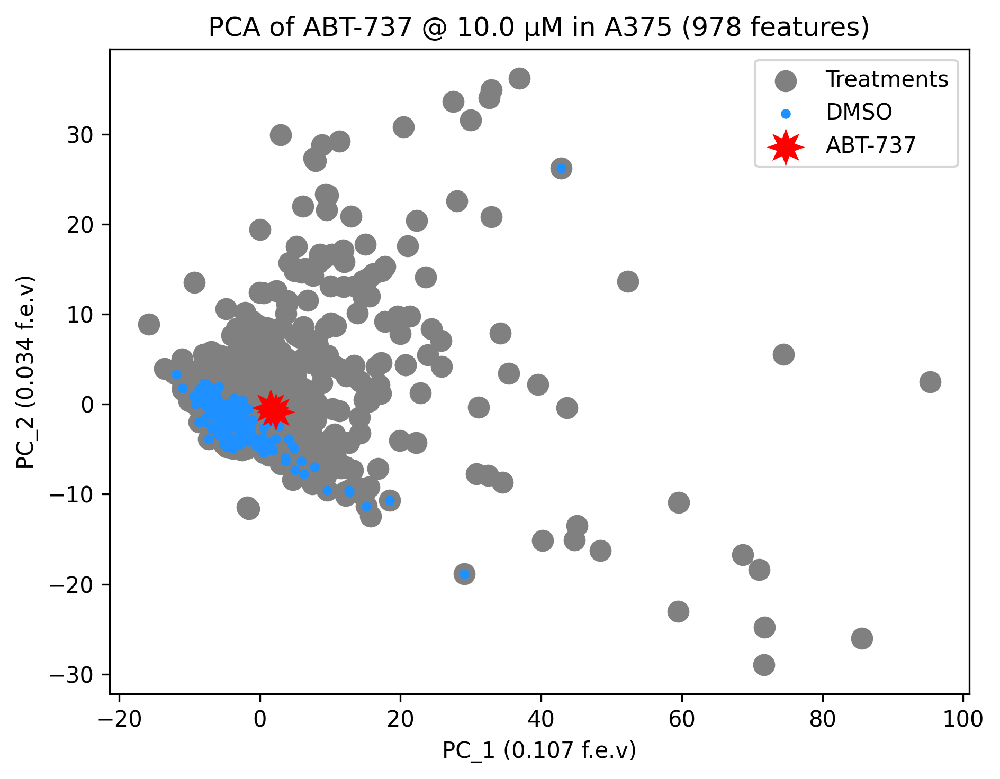

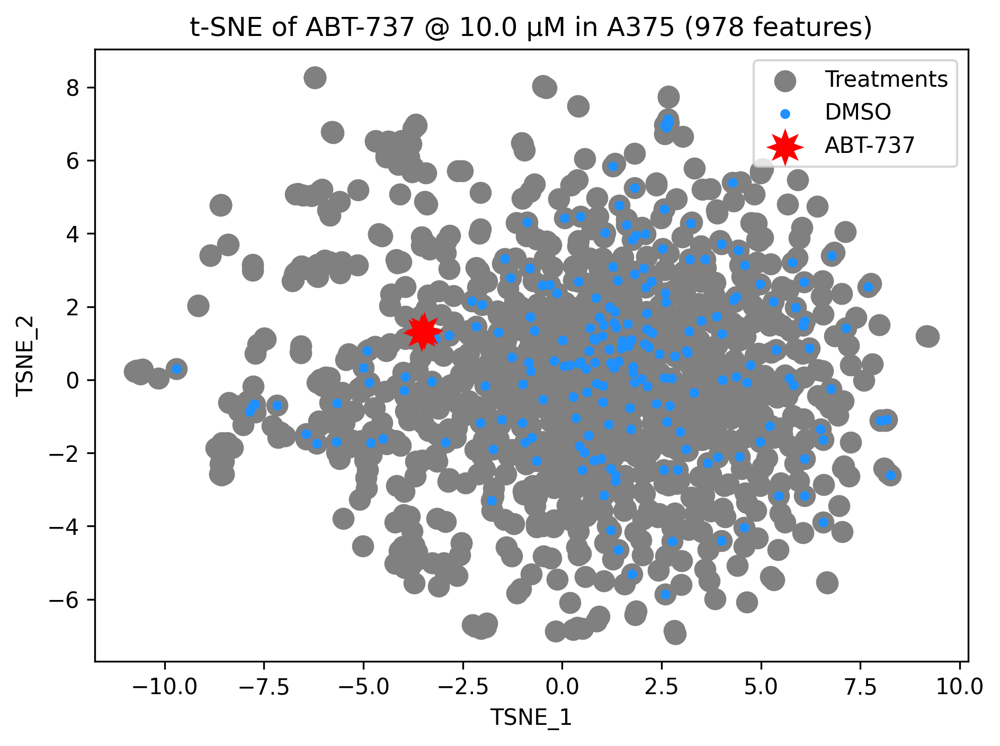

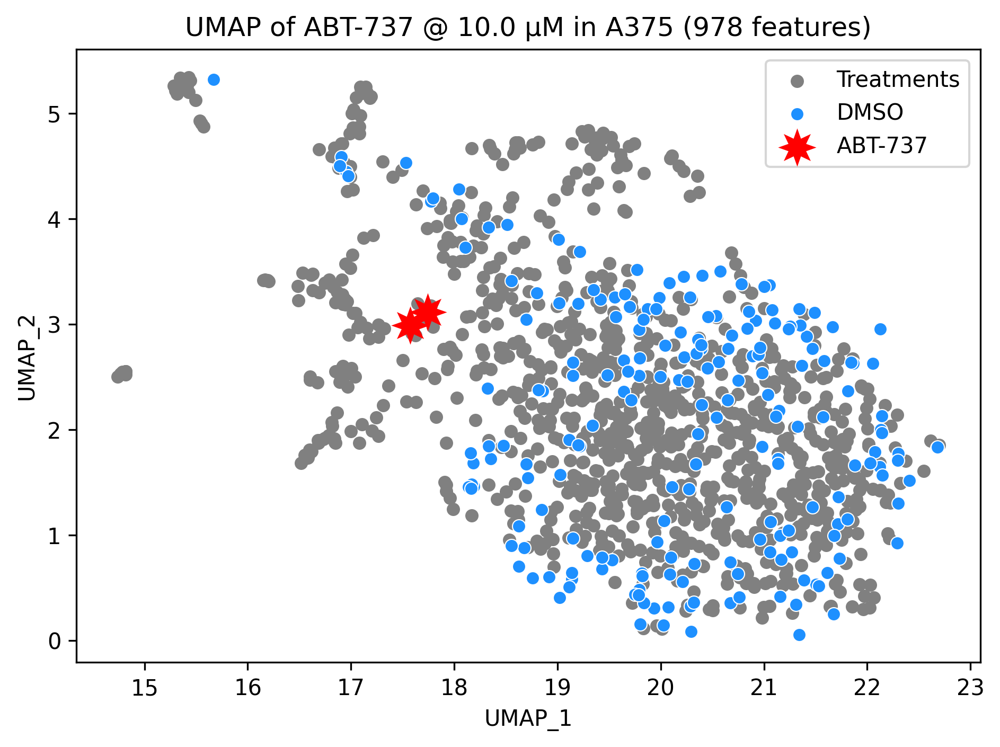

Loading fitted standard scaler and PCA found in split json dir (working_dir/split_data/stdscaler_and_pca.pkl)
Applying the transformer instantiated by <class 'sklearn.preprocessing._data.StandardScaler'>
['scaled_AARS', 'scaled_ABCB6', 'scaled_ABCC5', 'scaled_ABCF1', 'scaled_ABCF3', 'scaled_ABHD4', 'scaled_ABHD6', 'scaled_ABL1', 'scaled_ACAA1', 'scaled_ACAT2', 'scaled_ACBD3', 'scaled_ACD', 'scaled_ACLY', 'scaled_ACOT9', 'scaled_ADAM10', 'scaled_ADAT1', 'scaled_ADCK3', 'scaled_ADGRE5', 'scaled_ADGRG1', 'scaled_ADH5', 'scaled_ADI1', 'scaled_ADO', 'scaled_ADRB2', 'scaled_AGL', 'scaled_AKAP8', 'scaled_AKAP8L', 'scaled_AKR7A2', 'scaled_AKT1', 'scaled_ALAS1', 'scaled_ALDH7A1', 'scaled_ALDOA', 'scaled_ALDOC', 'scaled_AMDHD2', 'scaled_ANKRD10', 'scaled_ANO10', 'scaled_ANXA7', 'scaled_APBB2', 'scaled_APOE', 'scaled_APP', 'scaled_APPBP2', 'scaled_ARFIP2', 'scaled_ARHGAP1', 'scaled_ARHGEF2', 'scaled_ARHGEF12', 'scaled_ARID4B', 'scaled_ARID5B', 'scaled_ARL4C', 'scaled_ARNT2', 'scaled_ARPP19', 'sca

/home/ss942793/.conda/envs/leakproofcmap/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


          DDR1    PAX8    RPS5   ABCF1   SPAG7    RHOA   RNPS1  SMNDC1  \
211728  1.4617  1.7595 -1.5058  1.8389 -1.8396  4.9239 -0.7903  0.8661   
211880  0.9956  0.1554 -0.7769 -0.2363 -2.7138  2.7067 -4.6399  0.8424   
212036  1.9988  1.8676  0.2035  2.7177 -3.3038  4.4500 -2.7232  2.2104   
212193  1.1017  1.3589  0.1169 -0.0087  3.4637  0.4585 -1.1995  2.6727   
212183  1.6408 -0.1802 -0.0948  0.3725  4.6761  1.2507 -2.3163  3.0729   
...        ...     ...     ...     ...     ...     ...     ...     ...   
211705 -0.1444  0.0000  0.3764  0.4503  0.4315  0.1381  0.6745  0.6377   
211706 -0.5060 -0.3288 -5.2414 -0.8581 -0.5206  0.7922 -0.4630  0.5493   
211707 -1.0422 -0.8895  1.8875 -0.5272  0.8497  0.6942  0.6745  0.6485   
211708 -1.1690  1.0512 -0.6103 -0.4962 -0.6621 -0.4563  0.6745  0.4215   
211709 -1.5143  1.3453 -0.4670 -0.0655 -0.7892 -0.7457  2.0567  1.0375   

        ATP6V0B    RPS6  ...  scaled_ZNF451  scaled_ZNF586  scaled_ZNF589  \
211728  -1.8079 -0.6003  ...      

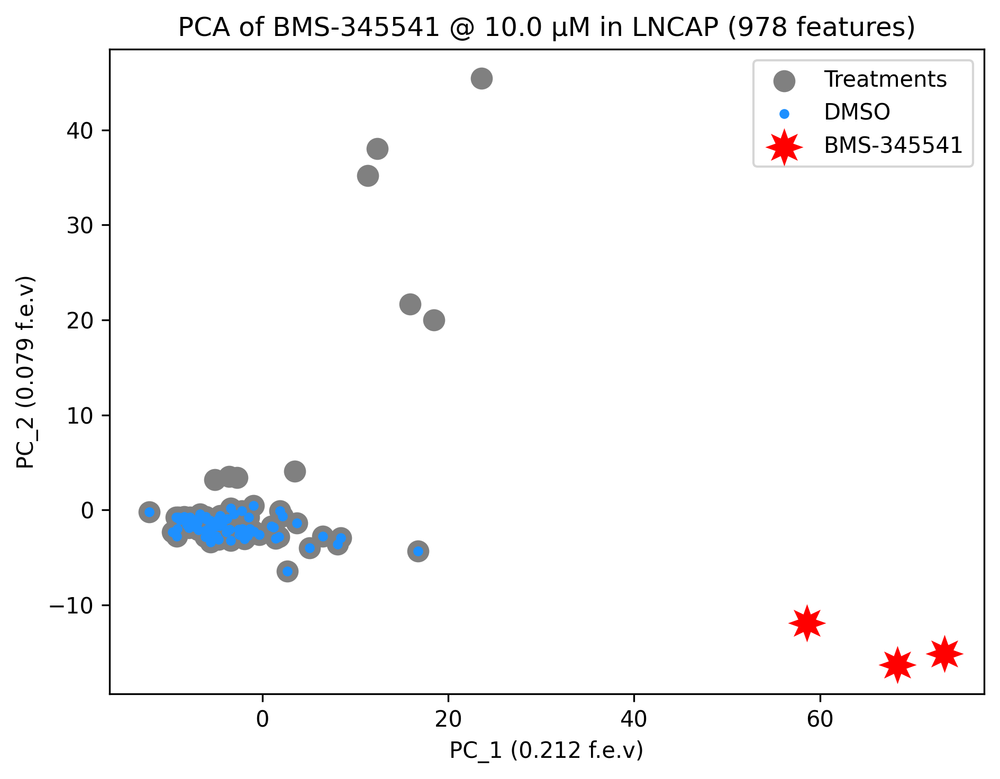

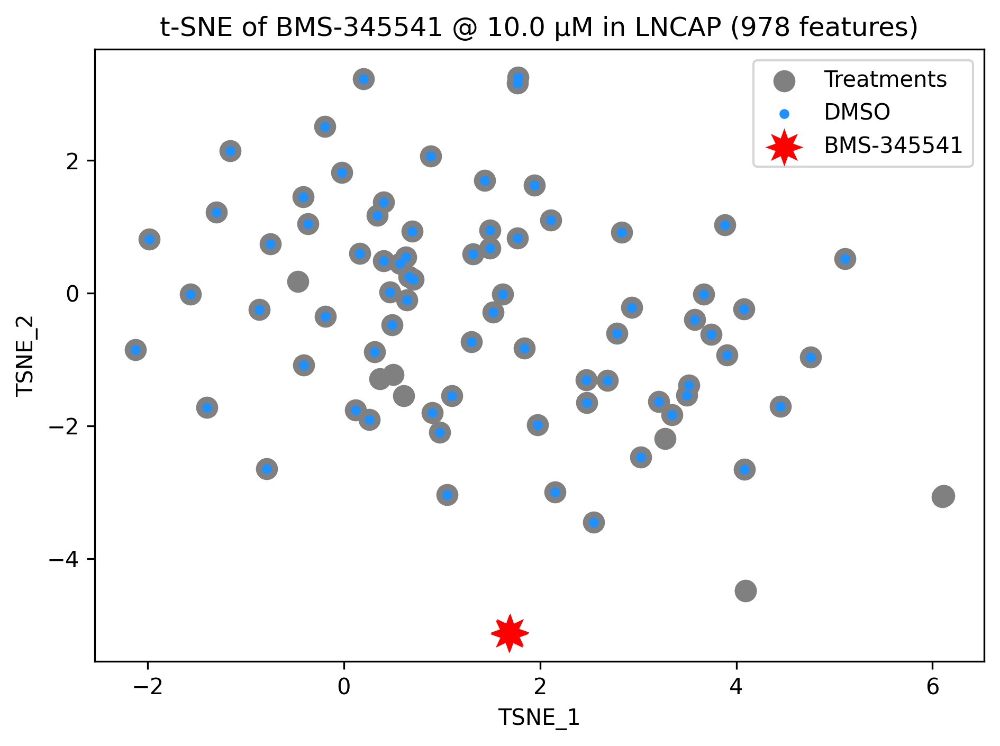

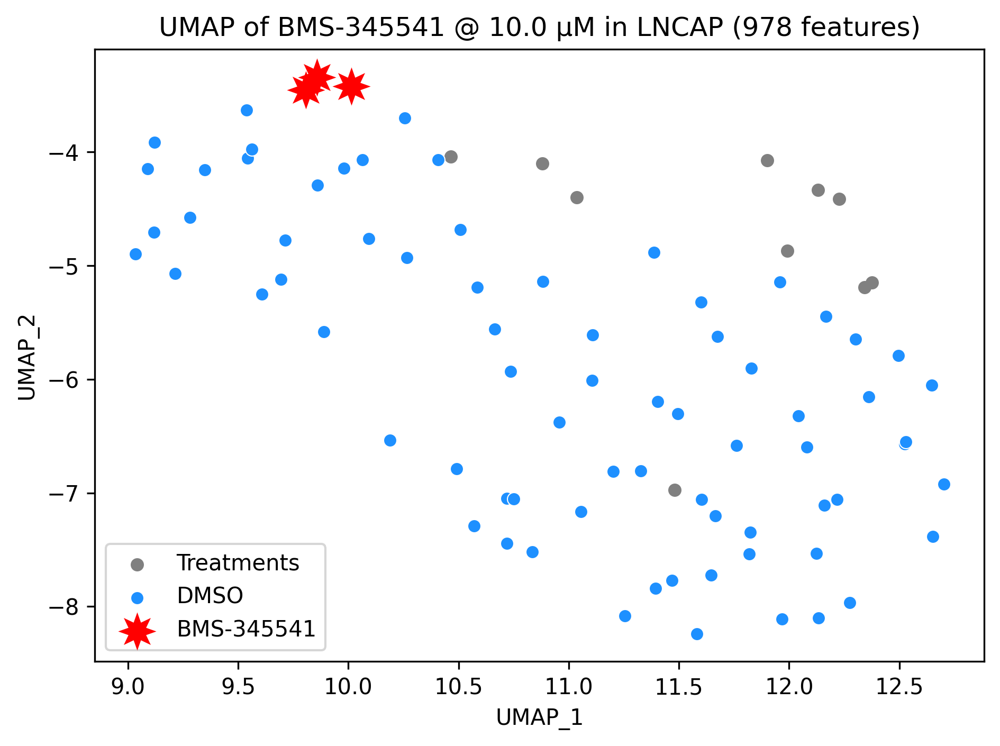

Loading fitted standard scaler and PCA found in split json dir (working_dir/split_data/stdscaler_and_pca.pkl)
Applying the transformer instantiated by <class 'sklearn.preprocessing._data.StandardScaler'>
['scaled_AARS', 'scaled_ABCB6', 'scaled_ABCC5', 'scaled_ABCF1', 'scaled_ABCF3', 'scaled_ABHD4', 'scaled_ABHD6', 'scaled_ABL1', 'scaled_ACAA1', 'scaled_ACAT2', 'scaled_ACBD3', 'scaled_ACD', 'scaled_ACLY', 'scaled_ACOT9', 'scaled_ADAM10', 'scaled_ADAT1', 'scaled_ADCK3', 'scaled_ADGRE5', 'scaled_ADGRG1', 'scaled_ADH5', 'scaled_ADI1', 'scaled_ADO', 'scaled_ADRB2', 'scaled_AGL', 'scaled_AKAP8', 'scaled_AKAP8L', 'scaled_AKR7A2', 'scaled_AKT1', 'scaled_ALAS1', 'scaled_ALDH7A1', 'scaled_ALDOA', 'scaled_ALDOC', 'scaled_AMDHD2', 'scaled_ANKRD10', 'scaled_ANO10', 'scaled_ANXA7', 'scaled_APBB2', 'scaled_APOE', 'scaled_APP', 'scaled_APPBP2', 'scaled_ARFIP2', 'scaled_ARHGAP1', 'scaled_ARHGEF2', 'scaled_ARHGEF12', 'scaled_ARID4B', 'scaled_ARID5B', 'scaled_ARL4C', 'scaled_ARNT2', 'scaled_ARPP19', 'sca

/home/ss942793/.conda/envs/leakproofcmap/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


          DDR1     PAX8     RPS5   ABCF1   SPAG7    RHOA      RNPS1  SMNDC1  \
113683  0.2872  -2.2797   0.3817  1.2179 -3.1696 -2.5465  -2.019800  0.6263   
113988  0.8333  -0.0827   0.5853  0.0000  0.3477 -0.4985   1.412200  0.5828   
114292  0.4083  24.2621  -2.2071 -0.5803 -7.1251  0.7619 -22.161699 -2.3789   
4246   -1.0642   0.3596  -0.9911 -0.6868 -0.2183  0.8766  -1.048800 -0.7561   
4256   -2.0932  -1.0071   0.0023 -5.9922 -1.0730 -0.1452   0.000000  0.9973   
...        ...      ...      ...     ...     ...     ...        ...     ...   
36468  -0.0486  -0.4349   2.0728  0.3077 -1.6424  0.7830   0.674500  0.2314   
126611 -1.3546  -0.7679   2.0912  3.3022 -1.5198  0.5671   0.818800 -0.9712   
78036  -1.1727  -1.3789 -14.3195 -0.1712 -0.3706  0.2621   0.000000  0.0000   
83826  -0.3668  -2.5100  -0.3997  0.2924 -0.8231 -0.0178   0.151800  0.9872   
89725  -0.0759   0.4024  -0.0552 -0.2817 -0.4090  0.5124   0.505200  0.8559   

        ATP6V0B    RPS6  ...  scaled_ZNF451  scaled

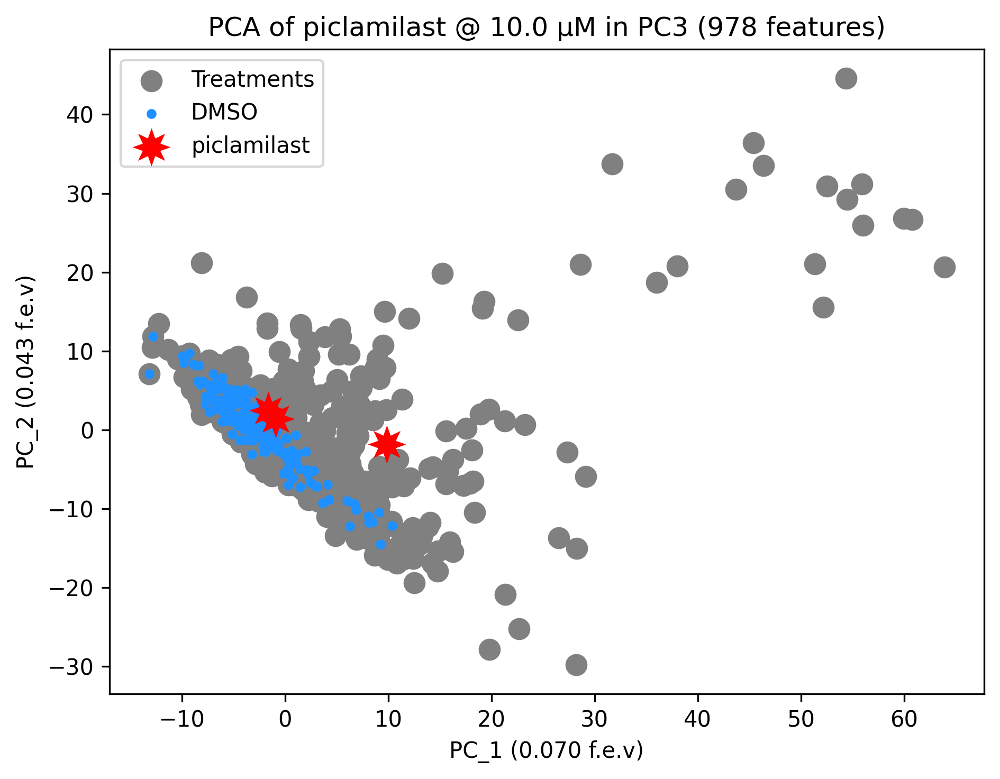

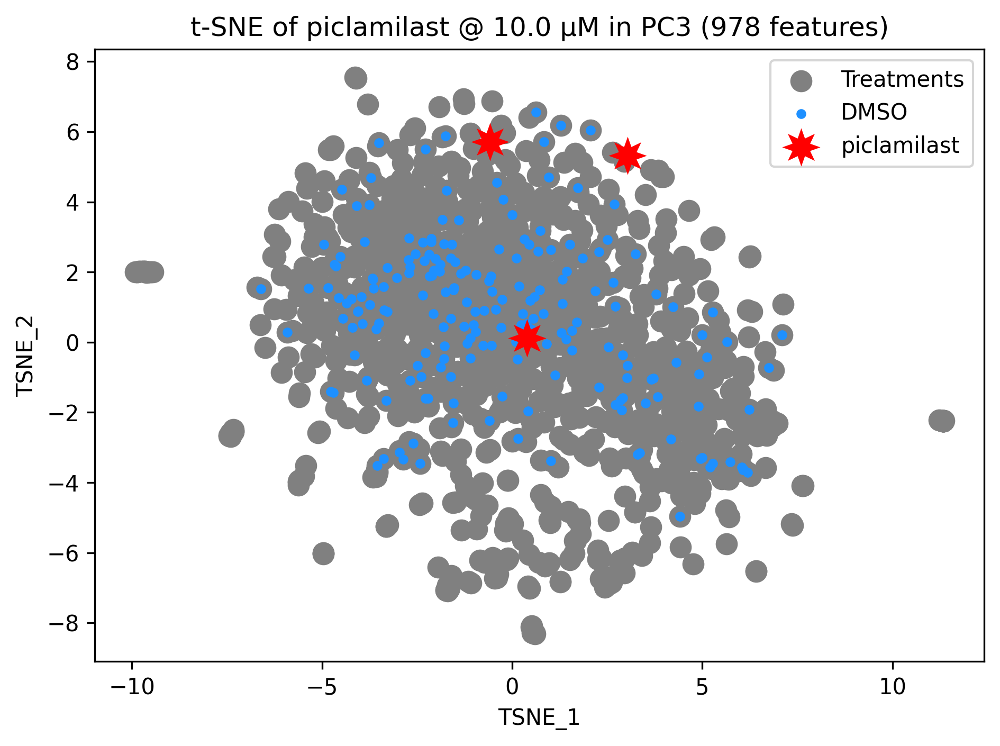

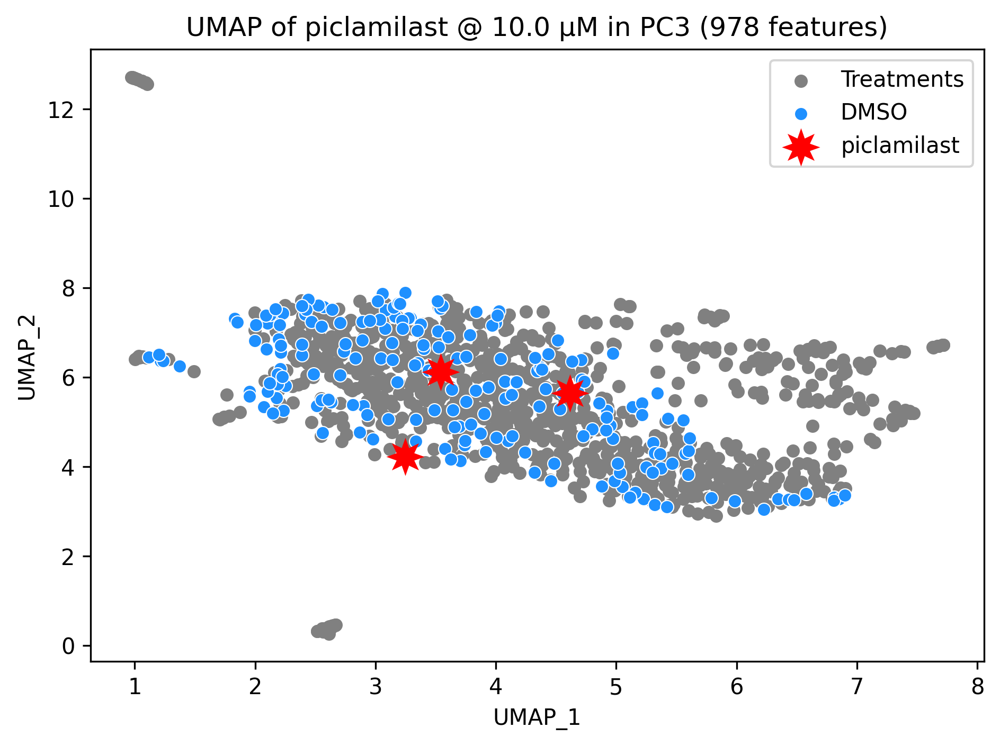

In [10]:
from leakproofcmap.phenonaut_functions import get_cmap_phenonaut_object
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from pathlib import Path
from leakproofcmap import CMAPSplit
import numpy as np

np_rng=np.random.default_rng(7)

working_dir = Path("working_dir")
eval_data_dir = (
    working_dir / Path("plot_data") / Path(MODEL_NAME) / Path(MODEL_IDENTIFIER)
)
output_dir = (
    eval_data_dir / Path("compactness_vs_distinctness_vs_uniqueness")
)

phe = get_cmap_phenonaut_object(
    Path("/local_scratch/data/phenonaut_datasets/"),
    working_dir=working_dir,
    pickle_dir=Path("pickles"),
)

scaled_features = [f"scaled_{f}" for f in phe.ds.features]



for interesting_treatment in [row_lu_hc, row_hu_hc, row_hu_lc, row_lu_lc]:
    cmap_split_object=CMAPSplit.load(
        working_dir
        / Path("split_data")
        / Path(f"cmap_split_cellidsplit{interesting_treatment['cell line split']}_moasplit{interesting_treatment['moa split']}.json")
        )

    split_df, features = cmap_split_object.get_df(
        phe.df, phe.ds.features, scale=False, pca=False, tvt_type="test"
    )

    split_df=split_df.query(f"cell_id=='{interesting_treatment['Cell line']}' and pert_idose_uM=={interesting_treatment['Concentration']}")

    # treatment_df=pd.concat([treatment_df1, treatment_df2, treatment_df3 ,treatment_df4 ,treatment_df5])
    treatment_df=pd.concat([
        split_df.query(f"pert_iname=='{interesting_treatment['Treatment']}'"),
        split_df.query(f"pert_iname!='{interesting_treatment['Treatment']}'").assign(Treatment='Treatment')
        ])

    cmap_split_object.merge_all_data_into_train()
 
    treatment_df = pd.concat(
        [
            treatment_df,
            cmap_split_object.get_df(
                phe.ds.df, phe.ds.features, scale=False, pca=False, tvt_type="train"
            )[0].query(f"moa=='control vehicle' and cell_id=='{interesting_treatment['Cell line']}'").assign(Treatment='DMSO'),
        ]
    )


    # PCA
    treatment_df, scaled_features = apply_transformer(
        StandardScaler, {}, treatment_df, phe.ds.features, scaled_features
    )
    print(scaled_features)
    treatment_df, PCA_features = apply_transformer(
        PCA, {"n_components": 2}, treatment_df, scaled_features, "PC"
    )
    treatment_df, TSNE_features = apply_transformer(
        TSNE, {"random_state": np_rng.integers(1)}, treatment_df, scaled_features, "TSNE"
    )

    treatment_df, UMAP_features = apply_transformer(
        UMAP, {"random_state": np_rng.integers(1)}, treatment_df, scaled_features, "UMAP"
    )
    print(treatment_df)

    treatment_df[['pert_iname']+PCA_features+TSNE_features+UMAP_features].to_csv(output_dir/f"plot_data_{interesting_treatment['Treatment']}.csv")

    # Plot PCA
    fig, ax = plt.subplots(1, figsize=(6.4, 4.8), dpi=300)

    sns.scatterplot(
        treatment_df.query(f"pert_iname!='{interesting_treatment['Treatment']}'"),
        x=PCA_features[0],
        y=PCA_features[1],
        c="grey",
        label="Treatments",
        linewidth=0,
        s=100,
        ax=ax,
    )
    
    sns.scatterplot(
        treatment_df.query(f"moa=='control vehicle'"),
        x=PCA_features[0],
        y=PCA_features[1],
        marker="o",
        c="dodgerblue",
        ax=ax,
        s=20,
        linewidth=0,
        label="DMSO",
    )

    sns.scatterplot(
        treatment_df.query(f"pert_iname=='{interesting_treatment['Treatment']}'"),
        x=PCA_features[0],
        y=PCA_features[1],
        marker=(8, 1, 0),
        c="red",
        ax=ax,
        s=300,
        linewidth=0,
        label=interesting_treatment['Treatment'],
    )

    plt.tight_layout()
    ax.set_title(
        f"PCA of {interesting_treatment['Treatment']} @ {interesting_treatment['Concentration']} µM in {interesting_treatment['Cell line']} ({len(scaled_features)} features)"
    )
    plt.savefig(output_dir/f"plot_pca_uniq_vs_cpct_{interesting_treatment['Cell line']}_{interesting_treatment['Treatment'].replace(' ','')}.png", dpi=300)
    plt.savefig(output_dir/f"plot_pca_uniq_vs_cpct_{interesting_treatment['Cell line']}_{interesting_treatment['Treatment'].replace(' ','')}.svg")
    plt.show()
    plt.close()

    # Plot tSNE
    fig, ax = plt.subplots(1, figsize=(6.4, 4.8), dpi=300)

    sns.scatterplot(
        treatment_df.query(f"pert_iname!='{interesting_treatment['Treatment']}'"),
        x=TSNE_features[0],
        y=TSNE_features[1],
        c="grey",
        label="Treatments",
        linewidth=0,
        s=100,
        ax=ax,
    )
    sns.scatterplot(
        treatment_df.query(f"moa=='control vehicle'"),
        x=TSNE_features[0],
        y=TSNE_features[1],
        marker="o",
        c="dodgerblue",
        ax=ax,
        s=20,
        linewidth=0,
        label="DMSO",
    )
    sns.scatterplot(
        treatment_df.query(f"pert_iname=='{interesting_treatment['Treatment']}'"),
        x=TSNE_features[0],
        y=TSNE_features[1],
        marker=(8, 1, 0),
        c="red",
        ax=ax,
        s=300,
        linewidth=0,
        label=interesting_treatment['Treatment'],
    )

    ax.set_title(
        f"t-SNE of {interesting_treatment['Treatment']} @ {interesting_treatment['Concentration']} µM in {interesting_treatment['Cell line']} ({len(scaled_features)} features)"
    )
    plt.tight_layout()
    plt.savefig(output_dir/f"plot_tsne_uniq_vs_cpct_{interesting_treatment['Cell line']}_{interesting_treatment['Treatment'].replace(' ','')}.png", dpi=300)
    plt.savefig(output_dir/f"plot_tsne_uniq_vs_cpct_{interesting_treatment['Cell line']}_{interesting_treatment['Treatment'].replace(' ','')}.svg")
    plt.show()


    # Plot UMAP
    fig, ax = plt.subplots(1, figsize=(6.4, 4.8), dpi=300)
    sns.scatterplot(
        treatment_df.query(f"pert_iname!='{interesting_treatment['Treatment']}'"),
        x=UMAP_features[0],
        y=UMAP_features[1],
        c="grey",
        linewidth=0,
        label="Treatments",
        ax=ax,
    )
    sns.scatterplot(
        treatment_df.query(f"moa=='control vehicle'"),
        x=UMAP_features[0],
        y=UMAP_features[1],
        marker="o",
        linewidth=0.5,
        c="dodgerblue",
        ax=ax,
        label="DMSO",
    )
    sns.scatterplot(
        treatment_df.query(f"pert_iname=='{interesting_treatment['Treatment']}'"),
        x=UMAP_features[0],
        y=UMAP_features[1],
        marker=(8, 1, 0),
        c="red",
        linewidth=0,
        s=300,
        ax=ax,
        label=interesting_treatment['Treatment'],
    )

    ax.set_title(
        f"UMAP of {interesting_treatment['Treatment']} @ {interesting_treatment['Concentration']} µM in {interesting_treatment['Cell line']} ({len(scaled_features)} features)"
    )

    plt.tight_layout()
    plt.savefig(output_dir/f"plot_umap_uniq_vs_cpct_{interesting_treatment['Cell line']}_{interesting_treatment['Treatment'].replace(' ','')}.png", dpi=300)
    plt.savefig(output_dir/f"plot_umap_uniq_vs_cpct_{interesting_treatment['Cell line']}_{interesting_treatment['Treatment'].replace(' ','')}.svg")
    plt.show()
    plt.close()